In [1]:
#01 常规库
import os        # 导入文件操作系统
import warnings  # 告警库
import random    # 生成随机数相关的库
import copy      # 与复制操作相关的库
import time      # 导入计时相关的库

#02 计算库
import math                         # 导入数学计算库
import pandas as pd                 # 数据处理库
import numpy as np                  # 科学计算库
import tensorflow as tf             #导入tensorflow库
import matplotlib.pyplot as plt     # 数据可视化库
import seaborn as sns               # 导入数据集分布可视化库  seaborn是基于matplotlib的数据集分布可视化库

# #03 深度学习相关库
# from sklearn.model_selection import train_test_split  # 数据集拆分
# from keras.models import *          # 导入序贯模型
# from keras.layers import *          # 导入全连接层
# from keras.layers.core import *
# from keras.utils import plot_model  # 导入 模型绘图工具
# import keras.layers as layers       # 导入 层 工具包
# import keras.backend as K           # 导入 后端 工具包
# from sklearn.metrics import mean_squared_error, explained_variance_score, mean_absolute_error,mean_absolute_percentage_error, r2_score  # 模型评估指标


# from solution import solution  # 01 导入参数初始化的库（自定义）
# import benchmarks              # 02 导入计算适应度的库（自定义）
# import KOA                     # 03 导入KOA算法本身库 （自定义）

#显示中文
plt.rcParams['font.sans-serif'] = ['SimHei']  # 用来正常显示中文标签
plt.rcParams['axes.unicode_minus'] = False    # 用来正常显示符号

#忽略警告
import warnings
warnings.filterwarnings("ignore")

#如果没有这个目录，则创建这个目录
if not os.path.isdir('result'):
    os.mkdir('result')


面向对象编程的理解，以下主要理解即可\
类——对象——方法\
人类——一个人——读书、写字等方法\
1、编写：鲸鱼类——气泡网捕猎、包围猎物、随机搜索\
2、调用：创建对象 一个鲸鱼群——调用捕猎的3种方法——返回猎物位置（全局最优解）

粒子群优化算法编写架构A+B：

模块A：算法定义\
模块A：01 算法参数初始化   （solution类）\
模块A：02 适应度计算      （benchmarks类）\
模块A：03 PSO算法核心公式   （PSO类）

模块B：算法实现\
模块B：01 算法参数修改\
模块B：02 数据读取与数据集划分\
模块B：03 PSO算法求解\
模块B：04 最优超参数应用于模型训练\
模块B：05 模型复现后的精度评定

模块A：01 算法参数初始化\
需要注意：\
问题：Python中 类未实例化引发的报错\
解决步骤：01  先要生成solution类的对象s\
解决步骤：02  再通过s调用__init__()方法，实现算法参数初始化
          

具体修改：\
在SMA类中，需要额外将\
其中的# 保存结果\
-----s = solution()\
修改为# 保存结果\
-----if __name__ == '__main__':\
-----------s = solution()\
-----------s.__init__()

In [2]:
# 01 算法参数初始化
class solution:
    def __init__(self):
        self.best = 0
        self.bestIndividual = []
        self.convergence = []
        self.optimizer = ""
        self.objfname = ""
        self.startTime = 0
        self.endTime = 0
        self.executionTime = 0
        self.lb = 0
        self.ub = 0
        self.dim = 0
        self.popnum = 0
        self.maxiers = 0

模块A：02 适应度计算

需要修改：\
1、根据需求  自行添加  适应度函数名称种类：适应度函数名，下界，上界，参数维度\
2、根据需求  自行添加  适应度函数：现有的是 函数F1最小值


未来如果需要寻找某个公式的参数最优解：\
1.先把公式整体编写好\
2.将需要优化的参数替换为x\
3.其他具体的输入变量在后面模块B中，导入数据进行代入赋值\
4.计算参数优化的评价指标（即期望什么值最小），最后return返回输出

In [3]:
# 02 适应度计算
class benchmarks:

# 1.适应度函数名称种类
#--------------------适应度函数汇总-------------------
    def getFunctionDetails(a):
        # [name, lb, ub, dim]
        # 适应度函数名，下界，上界，参数维度
        param = {
            "F1": ["F1", -100, 100, 30],
        }
        return param.get(a, "nothing")


# 2.适应度函数  F1最小值   适应度函数=目标函数=测试函数
#--------------------适应度值：F1函数的函数值-------------------
# 经典案例（便于上手理解）
    def F1(x):
        s = np.sum(x ** 2)
        print('F1 中的',x)

        return s
    

# 3.其他模块
#--------------------其他自定义函数-------------------
    def prod(it):
        p = 1
        for n in it:
            p *= n
        return p


    def Ufun(x, a, k, m):
        y = k * ((x - a) ** m) * (x > a) + k * ((-x - a) ** m) * (x < (-a))
        return y


模块A：03 PSO算法核心公式\
无参数修改与注意

In [4]:
# 03 PSO算法核心


#--------------------粒子群算法核心公式--------------------
def PSO(objf, lb, ub, dim, PopSize, iters):

    # PSO 设置参数数值
    Vmax = 1
    wMax = 0.9
    wMin = 0.2
    c1 = 1
    c2 = 1

    # 保存结果
    if __name__ == '__main__':
        s = solution()  #生成对象
        s.__init__()    #给对象赋值属性
        
    
    if not isinstance(lb, list):
        lb = [lb] * dim
    if not isinstance(ub, list):
        ub = [ub] * dim

    # 参数初始化
    vel = np.zeros((PopSize, dim))

    # 构建存储  个体最优适应度值的矩阵：
    pBestScore = np.zeros(PopSize)
    pBestScore.fill(float("inf"))    # 初始适应度值：默认数值为无穷大  便于数值更新
    pBest = np.zeros((PopSize, dim)) # 初始位置（种群数，维度）

    # 构建存储  群体最优适应度值的矩阵：
    gBest = np.zeros(dim)
    gBestScore = float("inf")        # 默认数值为无穷大  便于数值更新
    pos = np.zeros((PopSize, dim))   # 初始位置（种群数，维度）

    # 公式0：种群初始化
    for i in range(dim):
        pos[:, i] = np.random.uniform(0, 1, PopSize) * (ub[i] - lb[i]) + lb[i]

    # 初始化：最优值记录曲线
    convergence_curve = np.zeros(iters)

    #### 输出显示；PSO算法正在优化
    print('PSO is optimizing  "' + objf.__name__ + '"')

    # 计时
    timerStart = time.time()
    s.startTime = time.strftime("%Y-%m-%d-%H-%M-%S")

    # 根据最大迭代次数循环
    for l in range(0, iters):
        # 根据种群数量循环
        for i in range(0, PopSize):
            # 根据参数维度循环
            for j in range(dim):
                pos[i, j] = np.clip(pos[i, j], lb[j], ub[j])
            # 计算适应度
            fitness = objf(pos[i, :])

            # 更新个体最优 
            if pBestScore[i] > fitness:
                pBestScore[i] = fitness         # 更新适应度值
                pBest[i, :] = pos[i, :].copy()  # 更新位置

            # 更新群体最优 适应度值
            if gBestScore > fitness:
                gBestScore = fitness            # 更新适应度值
                gBest = pos[i, :].copy()        # 更新位置

        # 公式1：更新惯性权重
        w = wMax - l * ((wMax - wMin) / iters)

        for i in range(0, PopSize):
            for j in range(0, dim):
                # 设置随机数[0,1] r1和r2
                r1 = random.random()
                r2 = random.random()
                
                # 公式2：更新速度
                vel[i, j] = (
                    w * vel[i, j]
                    + c1 * r1 * (pBest[i, j] - pos[i, j])
                    + c2 * r2 * (gBest[j] - pos[i, j])
                )

                # 检查：更新后速度是否超出最大速度与最小速度
                if vel[i, j] > Vmax:
                    vel[i, j] = Vmax

                if vel[i, j] < -Vmax:
                    vel[i, j] = -Vmax

                # 公式3：更新位置
                pos[i, j] = pos[i, j] + vel[i, j]

        # 更新：群体最优记录曲线
        convergence_curve[l] = gBestScore  # l：当前迭代次数

    
    # 参数记录
    timerEnd = time.time()                           # 结束时间
    s.endTime = time.strftime("%Y-%m-%d-%H-%M-%S")   # 更新：结束时间
    s.executionTime = timerEnd - timerStart          # 更新：运行时间
    s.convergence = convergence_curve                # 更新：最优值记录曲线
    s.optimizer = "PSO"                              # 更新：算法名称
    s.bestIndividual = gBest                         # 更新：群体最优 位置
    s.best = gBestScore                              # 更新：群体最优 得分
    s.objfname = objf.__name__                       # 更新：对象名称

    return s

----------以上完成  模块A：PSO算法定义\
----------下面实战  模块B：优化F1函数的参数x获得局部最小值

模块B：01 算法参数修改

需要注意：\
测试函数名字==算法定义 02 适应度计算 的适应度函数定义名称\

需要修改：\
1、种群量级\
2、测试函数\
3、迭代次数

In [5]:
''' ----Part 01 PSO算法参数设置---'''

''' --------------------------- PSO算法参数设置 ----------------------------------'''
SearchAgents_no = 20  # 种群量级
Function_name = 'F1' # 测试函数
Max_iteration = 1000     # 迭代次数

''' ------------------------ 获取测试函数细节 F1/CAL ----------------------------------'''
func_details = benchmarks.getFunctionDetails(Function_name)
lb = func_details[1]
ub = func_details[2]
dim = func_details[3]
fobj = getattr(benchmarks, Function_name) # 获取函数求解

模块B：02 PSO算法求解：\
参数传递（算法——变量）

需要修改：\
1、如添加超参数数量，修改x2为第3个超参数变量名x3：\
    best_x3=x.bestIndividual[2]\
    print('最优x3是：',best_x3)

PSO is optimizing  "F1"
F1 中的 [-77.04769247   8.14683737  31.49370692  16.89283935 -99.2847936
 -11.98677058   3.04951278  47.73710735  58.72698373 -81.01189889
  24.20909914  91.76846986  27.86457879 -29.507898    66.96002271
  78.93258213 -54.44329155 -13.50679155 -88.81768728  -4.26133644
   9.16034725  79.4440257  -21.16866053  18.6824698  -21.98347911
 -20.17433605  27.24333027  96.31190679 -87.79662134 -32.75972593]
F1 中的 [ 9.02421953e+01  5.54818837e+01 -2.43123883e+01  3.69621472e+01
 -8.96016010e+01 -8.54771669e+01 -4.88805512e+01  4.11459764e+01
 -8.93936224e+01 -3.79616934e+01  2.76431075e+01  1.28144631e+01
  1.32556890e+01 -7.38355818e+01 -8.32164769e+01 -8.59025160e+01
  9.00108026e+01 -1.13841345e+01  8.75544736e+01  9.67748872e+01
 -2.65418949e+01 -2.22201047e+01 -5.01050299e+00  8.47647573e+01
  1.58449883e+01  3.15656601e+01 -5.00257669e-03  4.82287855e+01
  8.35194860e+01  4.83142777e+01]
F1 中的 [-84.46263653  -4.84378916 -44.8251025   59.45729993 -59.84074879
  29.71

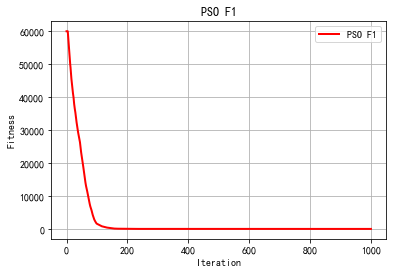

In [6]:
''' ----Part 02 PSO算法求解---'''

''' ------------------------ 粒子群优化算法求解 ----------------------------------'''
x = PSO(fobj, lb, ub, dim, SearchAgents_no, Max_iteration)
print()
print(x)                 # 算法群体（N维度的最优超参数变量）
print(x.bestIndividual)  # 群体中的最优个体（包含N个超参数）
''' ------------------------ 求解结果 ----------------------------------'''
IterCurve = x.convergence
Best_fitness = x.best
Best_Pos = x.bestIndividual
''' ------------------------ 参数传递 ----------------------------------'''
print('最优个体输出与参数传递')
print('最优个体输出与参数传递')
print('最优个体输出与参数传递')
print('最优个体输出与参数传递')
print('最优个体输出与参数传递')

print(x)                   # 算法群体（N维度的最优超参数变量）
print(x.best)              # 群体中的最优个体的适应度（对应神经网络的rmse）

#参数传递
best_x1=x.bestIndividual[0]
best_x2=x.bestIndividual[1]
print('最优x1是：',best_x1)   # 第一个超参数
print('最优x2是：',best_x2)   # 第二个超参数

''' ------------------------ 绘图 ----------------------------------'''
part1 = ['PSO',Function_name]
name1 = ' '.join(part1)
plt.figure(1)
plt.plot(IterCurve, 'r-', linewidth=2)
plt.xlabel('Iteration', fontsize='medium')
plt.ylabel("Fitness", fontsize='medium')
plt.grid()
plt.title(name1, fontsize='large')
label = [name1]
plt.legend(label, loc='upper right')
plt.savefig('result/PSO_Fitness_Decline_Curve.jpg')
plt.show()